In [1]:
import pandas as pd
import numpy as np
# import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [2]:
arr_1 = np.random.randn(50, 4)
df_1 = pd.DataFrame(arr_1, columns=['A', 'B', 'C', 'D'])
df_1.head()

,A,B,C,D
0,0.799733,-0.279431,-0.372478,-0.895614
1,-0.135321,0.788966,-1.703273,-1.168953
2,0.937789,-0.777183,-1.358271,-1.218545
3,-0.313487,-0.922933,-1.195102,1.527043
4,0.923194,0.179414,0.983147,0.124040


### Notice the Difference

<AxesSubplot:>

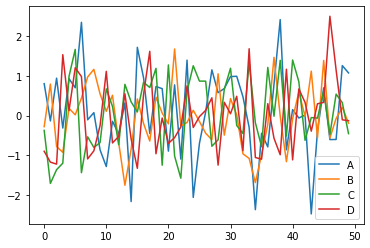

In [3]:
### matplotlib plot
df_1.plot()

In [4]:
### plotly plot
df_1.iplot()

### Line Plots

In [5]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()
# px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y': 'Price'})

px.line(df_stocks, x='date', y= ['GOOG', 'AAPL'], 
        labels = {'x': 'Date', 'y': 'Prices'}, title = 'AAPL vs GOOG'
       )

In [6]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL,
                        mode='lines', name = 'Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG,
                        mode='lines+markers', name = 'Google'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN,
                        mode='lines', name = 'Amazon', 
                        line = dict(color='firebrick', width=2, dash='dashdot')))

fig.update_layout(title = 'Stock Prices of Companies', 
                  xaxis_title = 'Price', 
                  yaxis_title = 'Date'
                 )

In [7]:
fig.update_layout(
    xaxis = dict(
        showline = True, 
        showgrid = False, 
        showticklabels = True, 
        linecolor = 'rgb(204, 204, 204)', 
        linewidth = 2, 
        ticks = 'outside', 
        tickfont = dict(
            family = 'Arial', 
            size = 12, 
            color = 'rgb(82, 82, 82)',
        )
    ),
    yaxis = dict(
        showgrid = False, 
        zeroline = False, 
        showline = False, 
        showticklabels = False
    ), 
    autosize = False, 
    margin = dict(
        autoexpand = False, 
        l = 100, 
        r = 20, 
        t = 110,
    ),
    showlegend = False, 
    plot_bgcolor = 'white'
)

### Bar Charts

In [8]:
df_in = px.data.gapminder().query("country == 'India'")
px.bar(df_in, x = 'year', y = 'pop')

In [9]:
df_tips = px.data.tips()
px.bar(df_tips, 
       x = 'day', 
       y = 'tip', 
       color = 'sex', 
       title = 'Tips by Sex on Each Day', 
       labels = {'tip': 'Tips on Each Day'}
      )

In [10]:
px.bar(df_tips, 
       x = 'sex', 
       y = 'total_bill', 
       color = 'smoker', 
       barmode = 'group'
      )

In [11]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, 
             y = 'pop', 
             x = 'country', 
             text = 'pop', 
             color = 'country'
            )
fig

In [12]:
fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition = 'outside', 
                 )
fig.update_layout(uniformtext_minsize = 8,
                  xaxis_tickangle = -45
                 )

### Scatter plots

In [13]:
df_iris = px.data.iris()
px.scatter(
    df_iris, 
    x = 'sepal_width', 
    y = 'sepal_length', 
    color = 'species', 
    size = 'petal_length', 
    hover_data = ['petal_width']
)

In [14]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = df_iris.sepal_width,
        y = df_iris.sepal_length, 
        mode = 'markers', 
        marker_color = df_iris.sepal_width, 
        text = df_iris.species, 
        marker = dict(
            showscale = True
        )
    )
)

In [15]:
fig.update_traces(marker_line_width = 2, 
                 marker_size = 10)

In [17]:
# scattergl for large datasets
fig = go.Figure(
    data = go.Scattergl(
        x = np.random.randn(100000),
        y = np.random.randn(100000), 
        mode = 'markers', 
        marker = dict(color = np.random.randn(100000), 
            colorscale = 'Viridis', 
            line_width = 1
        )
    )
)
fig

### Pie Chart

In [28]:
df_asia = px.data.gapminder().query('year == 2007').query('continent == "Asia"').query('pop > 10000000')
px.pie(df_asia,
       values = 'pop', 
       names = 'country', 
       title = 'Population of Asian Continent', 
       color_discrete_sequence = px.colors.sequential.RdBu
      )

In [26]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown', 'grey']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Dark', 'Psychic', 'Fire', 'Ground', 'Normal'],
                             values = [50, 40, 60, 69, 33, 78, 52]
                            )])
fig

In [27]:
fig.update_traces(hoverinfo = 'label+percent', 
                  textfont_size=15, 
                  textinfo = 'label+percent', 
                  pull = [0.1, 0, 0.2, 0, 0, 0, 0], 
                  marker = dict(colors=colors, line=dict(color = '#FFFFFF'))
                 )

### Histograms

In [33]:
dice_1 = np.random.randint(1, 7, 8000)
dice_2 = np.random.randint(1, 7, 8000)
dice_sum = dice_1 + dice_2
fig = px.histogram(dice_sum, 
                   nbins = 11, 
                   labels = {'value': 'Dice Roll'}, 
                   title = '8000 Dice Roll Histogram', 
                   marginal = 'violin', 
                   color_discrete_sequence = ['green']
                  )
fig

In [34]:
fig.update_layout(
    xaxis_title_text = 'Dice Sum', 
    yaxis_title_text = 'Frequency', 
    bargap = 0.1, 
    showlegend = False
)

In [35]:
px.histogram(df_tips, x = 'total_bill', color = 'sex')

### Box Plots

In [40]:
px.box(df_tips, 
       x = 'sex', 
       y = 'tip', 
       points = 'all', 
       color = 'sex'
      )

In [44]:
px.box(df_tips, x= 'day', y= 'tip', points= 'all', color='sex')

In [49]:
fig = go.Figure()
fig.add_trace(
    go.Box(
        x= df_tips.sex, 
        y= df_tips.tip, 
#         marker_color= 'blue', 
        boxmean = 'sd'
    )
)
fig

In [ ]:
df_stocks = px.data.stocks()
fig = go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints= 'all'))